In [ ]:
!apt-get install python3-OpenCV

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import cv2
import matplotlib
import numpy

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Read image file
image = cv2.imread("/content/boar_5.jpg")
cv2.imshow('boar',image)



In [ ]:
from PIL import Image

# Open image file
image = Image.open("/content/boar_5.jpg")

# Print image size
print(image.size)


(1084, 662)


In [ ]:
import cv2

# Read image file
image = cv2.imread("/content/boar_5.jpg")

# Convert image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Get intensity value of pixel at (x, y)
x = 10
y = 20
intensity = gray_image[y, x]
print("Pixel at ({}, {}) has intensity value {}".format(x, y, intensity))

# Get dimensions of image
height, width = gray_image.shape
print("Image has size {}x{}".format(width, height))


Pixel at (10, 20) has intensity value 57
Image has size 1084x662


In [ ]:
import cv2

# Read image file
image =  cv2.imread("/content/boar_5.jpg")

# Get image shape (height, width, number of channels)
height, width, channels = image.shape

# Print image shape
print("Height:", height)
print("Width:", width)
print("Channels:", channels)


Height: 662
Width: 1084
Channels: 3


In [ ]:
from PIL import Image

# Open image file
image = Image.open("/content/boar_5.jpg")

# Print image information
print("File format:", image.format)
print("Image mode:", image.mode)
print("Image size:", image.size)
print("Metadata:", image.info)


File format: JPEG
Image mode: RGB
Image size: (1084, 662)
Metadata: {}


In [ ]:
#white background

In [ ]:
from PIL import Image, ImageOps

# Load image and convert to grayscale
image =  Image.open("/content/boar_5.jpg").convert("L")

# Invert image and add white border
inverted = ImageOps.invert(image)
padded = ImageOps.expand(inverted, border=10, fill="white")

# Threshold image and make mask
thresholded = padded.point(lambda x: 255 if x > 100 else 0, mode='1')
mask = thresholded.convert("L")

# Apply mask to original image
result = Image.composite(image, Image.new("RGB", image.size, "white"), mask)

# Save result
result.save("result.jpg")


In [ ]:
import numpy as np
import cv2

# Read image file
image = cv2.imread("/content/boar_5.jpg")

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Threshold the image to create a mask
_, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Apply the mask to the image
result = cv2.bitwise_and(image, image, mask=mask)

# Create a white background
background = 255 * np.ones_like(image)

# Combine the background with the result
white_background = np.where(result==0, background, result)

# Save the output image
cv2.imwrite("white_background.jpg", white_background)

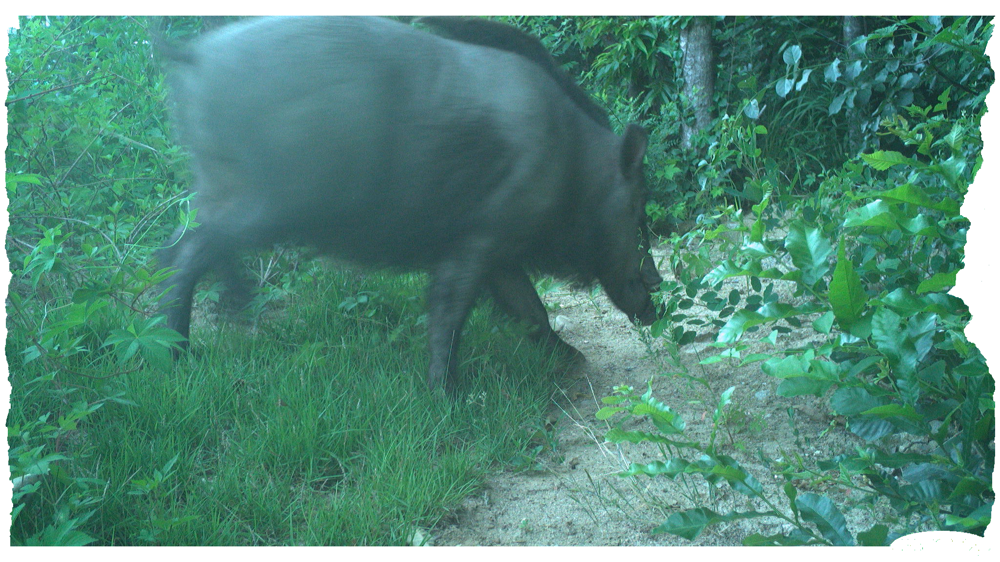

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image file
# image = cv2.imread("/content/boar_5.jpg")
image=cv2.imread('/content/drive/MyDrive/boar_all/Copy of Y2567.JPG')

# Create mask for foreground object
mask = np.zeros(image.shape[:2], np.uint8)
background = np.zeros((1, 65), np.float64)
foreground = np.zeros((1, 65), np.float64)
rect = (10, 10, image.shape[1]-20, image.shape[0]-20)
cv2.grabCut(image, mask, rect, background, foreground, 5, cv2.GC_INIT_WITH_RECT)

# Apply mask to extract foreground object
mask = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
foreground_image = image * mask[:,:,np.newaxis]

# Create white background
background_image = np.full(image.shape, 255, dtype=np.uint8)

# Composite foreground object onto white background
result = background_image.copy()
result[np.where(mask==1)] = foreground_image[np.where(mask==1)]

# Save result image
cv2.imwrite("result.jpg", result)
cv2_imshow(result)
cv2.waitKey(0)
cv2.destroyAllWindows()

(1152, 2048)

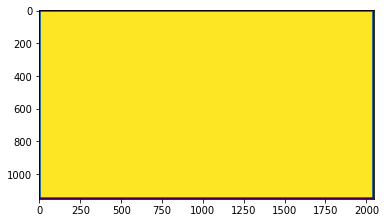

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(mask)
np.zeros(image.shape[:2], np.uint8).shape

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Read image file
image = cv2.imread('/content/drive/MyDrive/boar_all/Copy of Y2567.JPG')

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Threshold to create a binary mask
ret, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Invert the mask
mask = cv2.bitwise_not(mask)

# Apply the mask to the image
result = cv2.bitwise_and(image, image, mask=mask)

# Create a white background
background = 255 * np.ones_like(image, np.uint8)

# Combine the result with the white background
result1 = cv2.bitwise_or(result, background)
cv2.imwrite("result.jpg", result1)

# Display the result
cv2_imshow( result1)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
pip install  mediapipe

In [ ]:
    # DataFlair background removal
# import necessary packages
import os
import cv2
import numpy as np
import mediapipe as mp

# store background images in a list
image_path = '/content/drive/MyDrive/boar_all'
images = os.listdir(image_path)

image_index= 0
bg_image = cv2.imread(image_path+'/'+images[image_index])

In [ ]:
print(len(os.listdir(image_path)))
bg_image.shape

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# load image
img = cv2.imread('/content/drive/MyDrive/boar_all/Copy of Y2567.JPG')

# convert to graky
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold input image as mask
mask = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY)[1]

# negate mask
mask = 255 - mask

# apply morphology to remove isolated extraneous noise
# use borderconstant of black since foreground touches the edges
kernel = np.ones((3,3), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# anti-alias the mask -- blur then stretch
# blur alpha channel
mask = cv2.GaussianBlur(mask, (0,0), sigmaX=2, sigmaY=2, borderType = cv2.BORDER_DEFAULT)

# linear stretch so that 127.5 goes to 0, but 255 stays 255
mask = (2*(mask.astype(np.float32))-255.0).clip(0,255).astype(np.uint8)

# put mask into alpha channel
result = img.copy()
result = cv2.cvtColor(result, cv2.COLOR_BGR2BGRA)
result[:, :, 3] = mask

# save resulting masked image
cv2.imwrite('person_transp_bckgrnd.png', result)

# display result, though it won't show transparency
cv2_imshow( img)
cv2_imshow( gray)
cv2_imshow( mask)
cv2_imshow( result)
cv2.waitKey(0)
cv2.destroyAllWindows()

## image capture date

In [ ]:
from PIL import Image
from PIL.ExifTags import TAGS

# Open image file
image = Image.open("/content/drive/MyDrive/boar_all/Copy of Y2567.JPG")
# image = Image.open('/content/boar_5.jpg')    #if no tag can't find

# Get EXIF metadata
exif = image.getexif()

# Iterate over EXIF tags and print capture date if available
for tag_id, value in exif.items():
    tag = TAGS.get(tag_id, tag_id)
    if tag == "DateTimeOriginal":
        print("Capture date:", value)


Capture date: 2019:06:23 05:23:18


In [ ]:
# pip install exifread

In [179]:
import exifread

# Open image file
# with open("/content/drive/MyDrive/boar_all/Y0143.JPG", 'rb') as f:
with open("/content/PTDC0310.JPG", 'rb') as f:
    filepath=f.name
    print(os.path.basename(filepath))
    tags = exifread.process_file(f)

# Print capture date if available
if 'EXIF DateTimeOriginal' in tags:
    print("Capture date:", tags['EXIF DateTimeOriginal'])

    print("model:", tags['Image Model'])
[print(i) for i in filepath.split('/')]

PTDC0310.JPG
Capture date: 2022:10:21 23:18:16
model:                

content
PTDC0310.JPG


[None, None, None]

In [183]:
for tag in tags.keys():
    if tag not in ('JPEGThumbnail', 'TIFFThumbnail', 'Filename', 'EXIF MakerNote'):
        print( "Key: %s, value %s" % (tag, tags[tag]))

Key: Image ImageDescription, value               
Key: Image Make, value                        
Key: Image Model, value                
Key: Image Orientation, value Horizontal (normal)
Key: Image XResolution, value 180
Key: Image YResolution, value 180
Key: Image ResolutionUnit, value Pixels/Inch
Key: Image Software, value ver:20200804-2053              
Key: Image DateTime, value 2022:10:21 23:18:16
Key: Image YCbCrPositioning, value Co-sited
Key: Image ExifOffset, value 270
Key: Thumbnail Compression, value JPEG (old-style)
Key: Thumbnail XResolution, value 180
Key: Thumbnail YResolution, value 180
Key: Thumbnail ResolutionUnit, value Pixels/Inch
Key: Thumbnail JPEGInterchangeFormat, value 2072
Key: Thumbnail JPEGInterchangeFormatLength, value 4912
Key: EXIF ExposureTime, value 1/10
Key: EXIF FNumber, value 3
Key: EXIF ExposureProgram, value Program Normal
Key: EXIF ISOSpeedRatings, value 1600
Key: EXIF ExifVersion, value 0220
Key: EXIF DateTimeOriginal, value 2022:10:21 23:18:16
K

In [ ]:
from PIL import Image

# Open image file
# image = Image.open("/content/drive/MyDrive/boar_all/Copy of Y2567.JPG")
image = Image.open('/content/PTDC0032.JPG') 

# Check if EXIF metadata is available
exif_data = image._getexif()
if exif_data:
    print("EXIF metadata is available")
else:
    print("EXIF metadata is not available")



EXIF metadata is available


In [ ]:
import exifread

# Open thermal image file
with open("/content/drive/MyDrive/boar_all/Copy of Y2567.JPG", "rb") as f:
    # Read EXIF metadata
    tags = exifread.process_file(f)

    # Get ThermalTemperature tag
    if "ThermalTemperature" in tags:
        thermal_temp = tags["ThermalTemperature"].values[0].num / tags["ThermalTemperature"].values[0].den
        print("ThermalTemperature:", thermal_temp)

    # Get ThermalTemperatureMax tag
    if "ThermalTemperatureMax" in tags:
        thermal_temp_max = tags["ThermalTemperatureMax"].values[0].num / tags["ThermalTemperatureMax"].values[0].den
        print("ThermalTemperatureMax:", thermal_temp_max)

    # Get ThermalTemperatureMin tag
    if "ThermalTemperatureMin" in tags:
        thermal_temp_min = tags["ThermalTemperatureMin"].values[0].num / tags["ThermalTemperatureMin"].values[0].den
        print("ThermalTemperatureMin:", thermal_temp_min)


In [ ]:
import exifread

# Open image file
with open("/content/drive/MyDrive/boar_all/Copy of Y2567.JPG", 'rb') as f:
    tags = exifread.process_file(f)

# Check if the image has temperature tags
if 'EXIF private tag (0x0004)' in tags:
    # Read the temperature tag (ThermalTemperature)
    temperature = tags['EXIF private tag (0x0004)'].values[0]
    # Convert from tenths of degrees Celsius to degrees Celsius
    temperature_celsius = temperature / 10.0
    print("Temperature: {} degrees Celsius".format(temperature_celsius))
else:
    print("Temperature tag not found")


Temperature tag not found


## location

In [ ]:
import exifread

# Open image file
with open("/content/drive/MyDrive/boar_all/Copy of Y2567.JPG", 'rb') as f:
# with open("/content/boar_5.jpg", 'rb') as f:
    tags = exifread.process_file(f)

# Check if the image has GPS tags
if 'GPS GPSLatitude' in tags and 'GPS GPSLongitude' in tags:
    # Read the GPS latitude and longitude tags
    latitude = tags['GPS GPSLatitude'].values
    longitude = tags['GPS GPSLongitude'].values

    # Convert from degree/minute/second format to decimal degrees
    lat_deg = latitude[0].num / latitude[0].den
    lat_min = latitude[1].num / latitude[1].den
    lat_sec = latitude[2].num / latitude[2].den
    lat_dir = tags['GPS GPSLatitudeRef'].values
    latitude_decimal = lat_deg + (lat_min / 60) + (lat_sec / 3600)
    if lat_dir == 'S':
        latitude_decimal *= -1

    lon_deg = longitude[0].num / longitude[0].den
    lon_min = longitude[1].num / longitude[1].den
    lon_sec = longitude[2].num / longitude[2].den
    lon_dir = tags['GPS GPSLongitudeRef'].values
    longitude_decimal = lon_deg + (lon_min / 60) + (lon_sec / 3600)
    if lon_dir == 'W':
        longitude_decimal *= -1

    # Print the GPS location
    print("Latitude: {}, Longitude: {}".format(latitude_decimal, longitude_decimal))
else:
    print("GPS tags not found")


GPS tags not found


In [ ]:
tags

{'Image Make': (0x010F) ASCII=RECONYX @ 122,
 'Image Model': (0x0110) ASCII=HYPERFIRE 2 COVERT @ 130,
 'Image XResolution': (0x011A) Ratio=72 @ 150,
 'Image YResolution': (0x011B) Ratio=72 @ 158,
 'Image ResolutionUnit': (0x0128) Short=Pixels/Inch @ 66,
 'Image DateTime': (0x0132) ASCII=2019:06:23 05:23:18 @ 166,
 'Image YCbCrPositioning': (0x0213) Short=Co-sited @ 90,
 'Image ExifOffset': (0x8769) Long=300 @ 102,
 'EXIF ExposureTime': (0x829A) Ratio=1/30 @ 498,
 'EXIF ISOSpeedRatings': (0x8827) Short=800 @ 322,
 'EXIF ExifVersion': (0x9000) Undefined=0220 @ 334,
 'EXIF DateTimeOriginal': (0x9003) ASCII=2019:06:23 05:23:18 @ 506,
 'EXIF DateTimeDigitized': (0x9004) ASCII=2019:06:23 05:23:18 @ 526,
 'EXIF TimeZoneOffset': (0x882A) Signed Short=0 @ 370,
 'EXIF ComponentsConfiguration': (0x9101) Undefined=YCbCr @ 382,
 'EXIF Flash': (0x9209) Short=Flash did not fire, auto mode @ 394,
 'EXIF MakerNote': (0x927C) Undefined=[82, 69, 67, 79, 78, 89, 88, 72, 50, 0, 1, 206, 0, 0, 0, 0, 136, 18,

## temperatue 

In [ ]:
import cv2
import numpy as np

# Read thermal image file
image = cv2.imread("/content/drive/MyDrive/boar_all/Copy of Y2567.JPG")

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply adaptive thresholding
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

# Find contours of objects in the image
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Calculate the temperature of each object using the mean pixel value
temperatures = []
for contour in contours:
    mask = np.zeros_like(thresh)
    cv2.drawContours(mask, [contour], 0, 255, -1)
    mean_temp = cv2.mean(image, mask=mask)[0]
    temperatures.append(mean_temp)

# Print the estimated temperature of each object
print("Object temperatures (Celsius):", temperatures)


Object temperatures (Celsius): [2.0, 6.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.5, 4.395833333333333, 5.5200000000000005, 1.2000000000000002, 7.875, 8.0, 15.200000000000001, 0.0, 67.0, 89.0, 135.0, 104.0, 127.0, 54.0, 58.0, 69.0, 52.0, 48.0, 53.0, 54.0, 69.0, 65.0, 114.0, 115.0, 134.0, 137.0, 113.0, 140.0, 100.5, 163.0, 173.0, 164.0, 156.0, 136.0, 115.0, 94.0, 91.0, 78.5, 74.0, 76.5, 61.0, 61.0, 46.5, 58.0, 0.0, 62.0, 69.0, 134.0, 121.0, 102.0, 90.66666666666666, 87.0, 74.5, 135.5, 152.0, 175.0, 151.0, 182.0, 162.0, 160.5, 163.0, 155.0, 110.0, 132.0, 99.66666666666666, 111.0, 87.5, 92.0, 63.666666666666664, 77.0, 91.0, 74.0, 56.5, 56.666666666666664, 69.0, 68.0, 115.0, 111.0, 79.0, 62.0, 50.0, 85.0, 137.0, 135.0, 119.0, 156.0, 91.0, 94.0, 185.0, 149.0, 125.0, 133.0, 85.5, 98.5, 89.66666666666666, 124.5, 114.0, 103.0, 68.0, 83.0, 62.285714285714285, 60.666666666666664, 76.0, 74.0, 64.16666666666666, 54.0, 64.4, 63.2, 72.0, 75.0, 66.66666666666666, 100.0, 172.0, 81.5, 83.80000000000001, 86.0, 

In [ ]:
len(temperatures)

63519

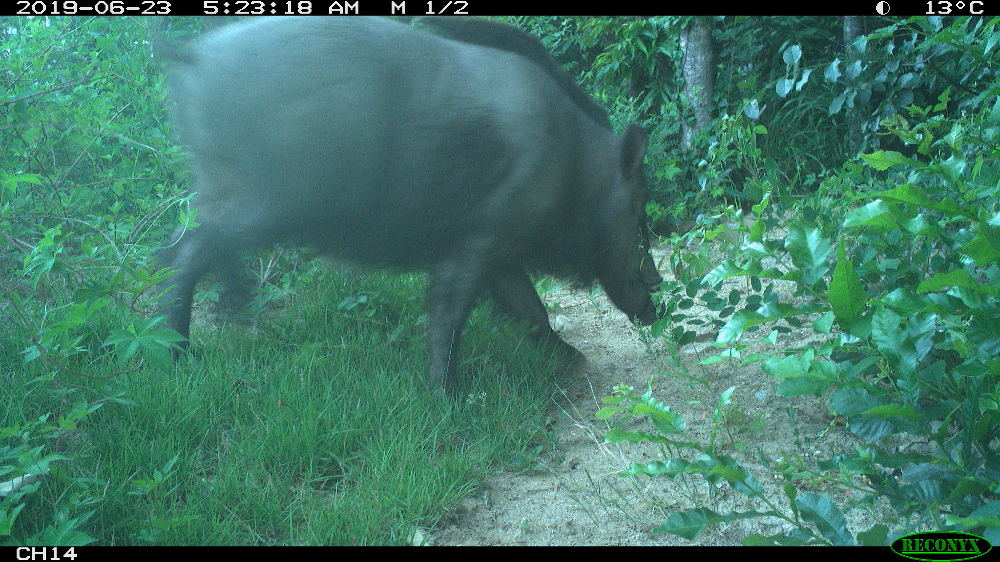

In [ ]:
cv2_imshow( img)